# CS5100 Final Project: Human Functional MRI Exploratory Analysis on Visual Perception Using Classification Models

Author: "Bronte" Sihan Li

## Prerequisites

In [311]:
import numpy as np
import pandas as pd
import os
from collections import Counter
import re
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split, permutation_test_score
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from itertools import product
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.manifold import TSNE
import plotly.express as px
import plotly.io as pio
from sklearn import decomposition

## Problem

Cognitive neuroscience is one of the most important fields for studying human intelligence and fMRI serves as a very useful tool for measuring neural activity, providing us with a wealth of data and allowing for inferences to what goes on both in the brain and outside of the brain such as external stimuli.
In this project, we aim to examine the BOLD5000 dataset, from one of the largest human fMRI study on visual perception, by perform a variety of exploratory analysis to assess whether we can make predictions about the stimuli based on brain activity changes.

## Data

### Data Selection
* The data source is from the fMRI project BOLD5000, a large scale human functional MRI study that includes over 5000 images paired with fMRI imaging data from subjects shown these photos.
### Project Description and Motivation
* The main focus of my final project will be to utilize the fMRI voxel ROI data from the over 5000 records and perform exploratory analysis by training a few different classifiers for assessing the predictability of sentiment on the visual input vs. brain activity changes (represented by beta values of fMRI voxel data).

In [321]:
BRAIN_REGIONS = ['LHEarlyVis', 'LHLOC', 'LHOPA', 'LHPPA', 'LHRSC', 'RHEarlyVis', 'RHLOC', 'RHOPA', 'RHPPA', 'RHRSC']
regions_data = {}

for region in BRAIN_REGIONS:
    array = np.load(f'data/ROI_betas/CSI1_GLMbetas-TYPED-FITHRF-GLMDENOISE-RR_allses_{region}.npy')
    data = pd.DataFrame(array)
    regions_data[region] = data
    print(f"The shape of region {region} data is {data.shape}")
    print(f"The mean is {np.mean(array)}")
    print(f"The standard deviation is {np.std(array)}")

The shape of region LHEarlyVis data is (5254, 210)
The mean is 3.1341409467700032e-09
The standard deviation is 1.0000001192092896
The shape of region LHLOC data is (5254, 152)
The mean is -3.6535654501790304e-09
The standard deviation is 1.0
The shape of region LHOPA data is (5254, 101)
The mean is 5.452607254596842e-09
The standard deviation is 1.0
The shape of region LHPPA data is (5254, 131)
The mean is 3.8450476136375755e-10
The standard deviation is 1.0000001192092896
The shape of region LHRSC data is (5254, 86)
The mean is 8.410850349527266e-10
The standard deviation is 0.9999999403953552
The shape of region RHEarlyVis data is (5254, 285)
The mean is -8.69993233010291e-09
The standard deviation is 0.9999998807907104
The shape of region RHLOC data is (5254, 190)
The mean is 4.454256963271064e-09
The standard deviation is 1.0000001192092896
The shape of region RHOPA data is (5254, 187)
The mean is -4.751394833135691e-10
The standard deviation is 0.9999998807907104
The shape of reg

## Cleaning the Data

To get the labels for our data, we perform the following data cleaning to extract two sets of labels: 
1. Sentiment labels: this is from behavioral data collected as the subjects rank whether they like or dislike the images shown to them
2. Scene labels: this represents whether the image stimulus is of a scene or an object

In [322]:
BEHAVIORAL_DATA_PATH = 'data/Behavioral_Data/'
sentiments = []
img_types = []

for file in sorted(os.listdir(BEHAVIORAL_DATA_PATH)):
    filepath = BEHAVIORAL_DATA_PATH + file
    if file.endswith('.tsv'):
        df = pd.read_csv(filepath, sep='\t')
        sentiments += df['Response'].values.tolist()
        img_types += df['ImgType'].values.tolist()

scene_labels = [0 if 'scenes' not in img else 1 for img in img_types ]
# In the original dataset, 1 = like, 2 = neutral, 3 = dislike
sentiment_labels = [1 if s == 3 else 0 for s in sentiments]  # 1 is dislike 0 is like or neutral
print(len(scene_labels))
print(len(sentiment_labels))
print(Counter(scene_labels))
print(Counter(sentiment_labels))

5254
5254
Counter({0: 4186, 1: 1068})
Counter({0: 4234, 1: 1020})


Because each fMRI session may have its own bias, we perform z-score normalization for the data for each session

In [323]:
# Get stimuli image names and label with session number

with open('data/labels/CSI1_imgnames.txt') as f:
    imgnames = f.readlines()
image_names = pd.DataFrame(imgnames)

SESSION_INFO_DIRECTORY = 'data/labels/CSI1/'

session_lengths = {i: 0 for i in range(1, 16)}
for subdir, dirs, files in os.walk(SESSION_INFO_DIRECTORY):
    for file in files:
        session_file = subdir + os.sep + file
        if session_file.endswith('.txt'):
            with open(session_file) as f:
                session_images = f.readlines()
                session_number = int(re.search(r'CSI_sess(\d\d)', session_file).group(1))
                session_lengths[session_number] += len(session_images)
print(sum([length for _, length in session_lengths.items()]))

# Z-score normalization by each session
def normalize_by_session(data: pd.DataFrame, session_lengths: dict) -> np.ndarray:
    sessions = []
    session = 1
    start_index = 0
    while session < 16:
        stop_index = start_index + session_lengths[session] - 1
        scaler = StandardScaler()
        session_array = scaler.fit_transform(data.loc[start_index:stop_index])
        sessions.append(session_array)
        start_index = stop_index + 1
        session += 1

    standardized_data = np.concatenate(sessions)
    return standardized_data

# Now we normalize each region by session
for region, data in regions_data.items():
    regions_data[region] = normalize_by_session(data, session_lengths)

5254


## Learning Model


Here we explore the correlation between our fMRI data and their labels using different machine learning classification techniques: random forest classifier, support vector machine, and multi-layer perceptron.

First, we split out our training dataset and balance the data with random over sampling and under sampling.

In [199]:
# First we need to balance our training dataset
def balance_dataset(X: np.ndarray, y: list):

    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.9, random_state=42, stratify=y)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    print(f"Original sample sizes: {Counter(y_train)}")

    # instantiating over and under sampler
    over = RandomOverSampler(sampling_strategy={1: 2000}, random_state=42)
    under = RandomUnderSampler(sampling_strategy={0: 2000}, random_state=42)
    # first performing oversampling to minority class
    X_over, y_over = over.fit_resample(X_train, y_train)
    print(f"Oversampled: {Counter(y_over)}")
    # now to combine under sampling 
    X_combined_sampling, y_combined_sampling = under.fit_resample(X_over, y_over)
    print(f"Combined Random Sampling: {Counter(y_combined_sampling)}")

    return X_combined_sampling, y_combined_sampling, X_test, y_test

Here we define functions to train our three different classfiers.

In [200]:
def train_rfc(X_combined_sampling: np.ndarray, y_combined_sampling: list, X_test: np.ndarray, y_test: list):
    rfc = RandomForestClassifier(random_state=42)
    rfc.fit(X_combined_sampling, y_combined_sampling)
    y_pred = rfc.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    print('Accuracy score:')
    print(score)
    print(classification_report(y_test, y_pred))
    return rfc, score
def train_svm(X_combined_sampling: np.ndarray, y_combined_sampling: list, X_test: np.ndarray, y_test: list):
    clf = svm.SVC(random_state=42)
    clf.fit(X_combined_sampling, y_combined_sampling)
    y_pred = clf.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    print('Accuracy score:')
    print(score)
    print(classification_report(y_test, y_pred))
    return clf, score

In [296]:
def train_mlp(region, data, labels):
    mlp_clf = MLPClassifier(hidden_layer_sizes=(150,100,50), max_iter=50,activation = 'tanh',solver='adam',random_state=1, alpha=0.0001, learning_rate='constant')
    print(f'Training for brain region: {region} for MLP classification')
    X = data
    y = labels
    # Split and balance dataset
    X_train, y_train, X_test, y_test = balance_dataset(X, y)
    print(f'Training results for MLP classifier for brain region {region}:')
    mlp_clf.fit(X_train, y_train)
    y_pred = mlp_clf.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    print('Accuracy score:')
    print(score)
    print(classification_report(y_test, y_pred))
    return mlp_clf, score

In [297]:
def train_and_get_scores(regions_data, labels, label_type):
    regions_clf_rows = []

    for region, data in regions_data.items():
        print(f'Training for brain region: {region} for {label_type} classification')
        X = data
        y = labels
        # Split and balance dataset
        X_train, y_train, X_test, y_test = balance_dataset(X, y)
        print(f'Training results for random forest classifier:')
        rfc_clf, rfc_accuracy = train_rfc(X_train, y_train, X_test, y_test)
        print(f'Training results for support vector machine:')
        svm_clf, svm_accuracy = train_svm(X_train, y_train, X_test, y_test)
        mlp_clf, mlp_accuracy = train_mlp(region, data, labels)
        regions_clf_rows.append({'region': region, 'rfc_accuracy': rfc_accuracy, 'svm_accuracy': svm_accuracy, 'mlp_accuracy': mlp_accuracy})

        regions_df = pd.DataFrame(regions_clf_rows)
        regions_df.head(10)
    return rfc_clf, svm_clf, mlp_clf, regions_df

We will now train our models on the "scene" labels.

In [298]:
rfc_scene, svm_scene, mlp_scene, scene_scores_df = train_and_get_scores(regions_data, scene_labels, 'scene')

Training for brain region: LHEarlyVis for scene classification
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Training results for random forest classifier:
Accuracy score:
0.7927756653992395
              precision    recall  f1-score   support

           0       0.80      0.99      0.88       419
           1       0.38      0.03      0.05       107

    accuracy                           0.79       526
   macro avg       0.59      0.51      0.47       526
weighted avg       0.71      0.79      0.71       526

Training results for support vector machine:
Accuracy score:
0.623574144486692
              precision    recall  f1-score   support

           0       0.78      0.73      0.76       419
           1       0.16      0.21      0.18       107

    accuracy                           0.62       526
   macro avg       0.47      0.47      0.47       526
weighted avg       0.66      0.6

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.



Accuracy score:
0.6083650190114068
              precision    recall  f1-score   support

           0       0.78      0.70      0.74       419
           1       0.17      0.23      0.20       107

    accuracy                           0.61       526
   macro avg       0.48      0.47      0.47       526
weighted avg       0.66      0.61      0.63       526

Training for brain region: LHPPA for scene classification
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Training results for random forest classifier:
Accuracy score:
0.7832699619771863
              precision    recall  f1-score   support

           0       0.80      0.98      0.88       419
           1       0.23      0.03      0.05       107

    accuracy                           0.78       526
   macro avg       0.51      0.50      0.46       526
weighted avg       0.68      0.78      0.71       526

Training results for suppo

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.



Accuracy score:
0.6768060836501901
              precision    recall  f1-score   support

           0       0.82      0.76      0.79       419
           1       0.27      0.35      0.30       107

    accuracy                           0.68       526
   macro avg       0.55      0.55      0.55       526
weighted avg       0.71      0.68      0.69       526

Training for brain region: RHEarlyVis for scene classification
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Training results for random forest classifier:
Accuracy score:
0.779467680608365
              precision    recall  f1-score   support

           0       0.79      0.98      0.88       419
           1       0.00      0.00      0.00       107

    accuracy                           0.78       526
   macro avg       0.40      0.49      0.44       526
weighted avg       0.63      0.78      0.70       526

Training results for s

Similarly, we train our model on "sentiment" labels.

In [305]:
rfc_sentiment, svm_sentiment, mlp_sentiment, sentiment_scores_df = train_and_get_scores(regions_data, sentiment_labels, 'sentiment')

Training for brain region: LHEarlyVis for sentiment classification
Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Training results for random forest classifier:
Accuracy score:
0.7908745247148289
              precision    recall  f1-score   support

           0       0.80      0.98      0.88       424
           1       0.10      0.01      0.02       102

    accuracy                           0.79       526
   macro avg       0.45      0.49      0.45       526
weighted avg       0.67      0.79      0.72       526

Training results for support vector machine:
Accuracy score:
0.688212927756654
              precision    recall  f1-score   support

           0       0.81      0.79      0.80       424
           1       0.22      0.25      0.23       102

    accuracy                           0.69       526
   macro avg       0.52      0.52      0.52       526
weighted avg       0.70     

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.



Accuracy score:
0.6273764258555133
              precision    recall  f1-score   support

           0       0.81      0.71      0.75       424
           1       0.19      0.29      0.23       102

    accuracy                           0.63       526
   macro avg       0.50      0.50      0.49       526
weighted avg       0.69      0.63      0.65       526

Training for brain region: LHPPA for sentiment classification
Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Training results for random forest classifier:
Accuracy score:
0.7984790874524715
              precision    recall  f1-score   support

           0       0.81      0.99      0.89       424
           1       0.17      0.01      0.02       102

    accuracy                           0.80       526
   macro avg       0.49      0.50      0.45       526
weighted avg       0.68      0.80      0.72       526

Training results for s

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.



Accuracy score:
0.6730038022813688
              precision    recall  f1-score   support

           0       0.82      0.76      0.79       424
           1       0.24      0.32      0.28       102

    accuracy                           0.67       526
   macro avg       0.53      0.54      0.53       526
weighted avg       0.71      0.67      0.69       526

Training for brain region: RHEarlyVis for sentiment classification
Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Training results for random forest classifier:
Accuracy score:
0.8003802281368821
              precision    recall  f1-score   support

           0       0.81      0.99      0.89       424
           1       0.20      0.01      0.02       102

    accuracy                           0.80       526
   macro avg       0.50      0.50      0.45       526
weighted avg       0.69      0.80      0.72       526

Training results 

## Tuning and Feature Extraction

For tuning and feature extraction, we implement two different methods for the different classifiers.
* Recursive feature elimination with cross validation: RFECV recursively eliminates features from the dataset and performs k-fold cross validation to find the optimal number of features and calculates the best accuracy score achieved this way. Here we perform RFECV on our random forest classifier for each brain region.
* Grid search: To find out the best set of hyper-parameters for our MLP classifier, we perform an exhaustive search trying out different combinations of the parameters.


In [127]:
def do_rfecv(X_train, y_train, X_test, y_test, rfc_estimator, brain_region):

    min_features_to_select = 1  # Minimum number of features to consider
    rfecv = RFECV(
        estimator=rfc_estimator,
        step=0.1,
        cv=StratifiedKFold(3),
        scoring="accuracy",
        min_features_to_select=min_features_to_select,
    )
    rfecv.fit(X_train, y_train)
    
    y_pred = rfecv.predict(X_test)
    best_accuracy = accuracy_score(y_test, y_pred)

    metrics = {'region': brain_region, 'best_accuracy': best_accuracy,'n_features_originally': X_train.shape[1], 'n_features_after_elimination': rfecv.n_features_}

    print(f"Optimal number of features : {rfecv.n_features_}")


    return rfecv, metrics

    

In [85]:
rfecv_sentiment_rows = []
rfecv_sentiment_models = {}
for region, data in regions_data.items():
    X = data
    y = sentiment_labels
    # Split and balance dataset
    X_train, y_train, X_test, y_test = balance_dataset(X, y)
    rfc = RandomForestClassifier(random_state=42)
    rfc.fit(X_train, y_train)
    rfecv, metrics = do_rfecv(X_train, y_train, X_test, y_test, rfc, region)
    rfecv_sentiment_rows.append(metrics)
    rfecv_sentiment_models[region] = rfecv

rfecv_sentiment_df = pd.DataFrame(rfecv_sentiment_rows)
rfecv_sentiment_df.head(10)

Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 210
Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 137
Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 101
Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 131
Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 86
Original sample sizes: Counter({0: 3810, 1: 918})
Oversampled: Counter({0: 3810, 1: 2000})
Combined Random Samp

In [161]:
rfecv_scene_rows = []
rfecv_scene_models = {}
for region, data in regions_data.items():
    X = data
    y = scene_labels
    # Split and balance dataset
    X_train, y_train, X_test, y_test = balance_dataset(X, y)
    rfc = RandomForestClassifier(random_state=42)
    rfc.fit(X_train, y_train)
    rfecv, metrics = do_rfecv(X_train, y_train, X_test, y_test, rfc, region)
    rfecv_scene_rows.append(metrics)
    rfecv_scene_models[region] = rfecv

rfecv_scene_df = pd.DataFrame(rfecv_scene_rows)

Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 147
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 92
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 81
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 118
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Optimal number of features : 70
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampli

We can see the final accuracy from testing against the test dataset and number of features that were eliminated.

In [299]:
rfecv_scene_df.head(10)

,region,best_accuracy,n_features_originally,n_features_after_elimination
0,LHEarlyVis,0.779468,210,147
1,LHLOC,0.785171,152,92
2,LHOPA,0.781369,101,81
3,LHPPA,0.804183,131,118
4,LHRSC,0.769962,86,70
5,RHEarlyVis,0.783270,285,285
6,RHLOC,0.775665,190,152
7,RHOPA,0.779468,187,115
8,RHPPA,0.781369,200,180
9,RHRSC,0.781369,143,143


In [165]:
regions_data_rfe_extracted_scene = {}
for region, rfecv in rfecv_scene_models.items():
    regions_data_rfe_extracted_scene[region] = rfecv.transform(regions_data[region])
train_and_get_scores(regions_data_rfe_extracted_scene, scene_labels, 'scene')

Training for brain region: LHEarlyVis for scene classification
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Training results for random forest classifier:
Accuracy score:
0.779467680608365
              precision    recall  f1-score   support

           0       0.80      0.97      0.88       419
           1       0.20      0.03      0.05       107

    accuracy                           0.78       526
   macro avg       0.50      0.50      0.46       526
weighted avg       0.68      0.78      0.71       526

Training results for support vector machine:
Accuracy score:
0.6577946768060836
              precision    recall  f1-score   support

           0       0.80      0.76      0.78       419
           1       0.21      0.24      0.22       107

    accuracy                           0.66       526
   macro avg       0.50      0.50      0.50       526
weighted avg       0.68      0.6

(RandomForestClassifier(random_state=42),
 SVC(random_state=42),
        region  rfc_accuracy  svm_accuracy
 0  LHEarlyVis      0.779468      0.657795
 1       LHLOC      0.785171      0.674905
 2       LHOPA      0.781369      0.614068
 3       LHPPA      0.804183      0.699620
 4       LHRSC      0.769962      0.669202
 5  RHEarlyVis      0.783270      0.692015
 6       RHLOC      0.775665      0.642586
 7       RHOPA      0.779468      0.692015
 8       RHPPA      0.781369      0.674905
 9       RHRSC      0.781369      0.627376)

In [157]:
def plot_rfecv(ax, grid_scores, brain_region):
    # Plot number of features VS. cross-validation scores
    ax.plot(
        np.linspace(0, 1.0, num=len(grid_scores)),
        grid_scores, 
    )
    ax.legend(['split 0', 'split 1','split 2'])
    ax.set_title(f'Brain region: {brain_region}', fontname='applegothic')

We can visualize the process of feature elimination:

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:103: FutureWarning:

The `grid_scores_` attribute is deprecated in version 1.0 in favor of `cv_results_` and will be removed in version 1.2.

/var/folders/cx/l3gnx5dn4gs_zc1wtxc7xyf40000gn/T/ipykernel_27933/2790550617.py:14: UserWarning:

This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.



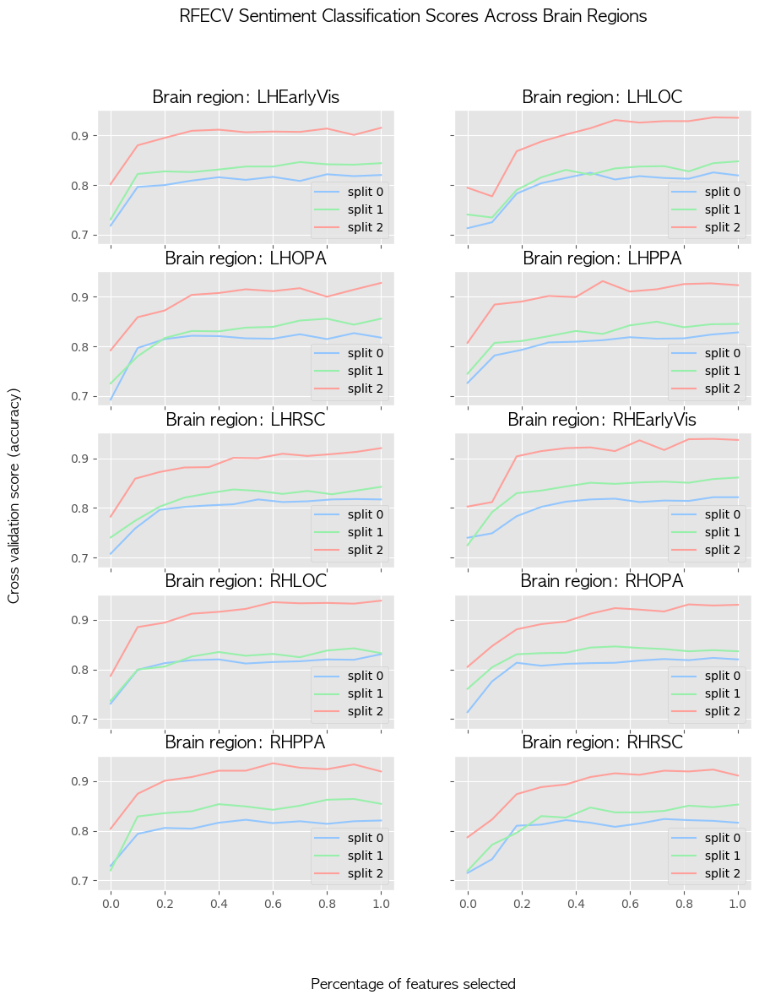

In [159]:
plt.style.use('seaborn-pastel')
fig, axs = plt.subplots(5, 2, sharex=True, sharey=True, squeeze=False, figsize=(10, 12))
fig.suptitle("RFECV Sentiment Classification Scores Across Brain Regions", fontname='applegothic', size='x-large')
ax_indexes = list(product(range(0,5), range(0,2)))
i = 0
for region, rfecv in rfecv_sentiment_models.items():
    a, b = ax_indexes[i]
    plot_rfecv(axs[a, b], rfecv.grid_scores_, region)
    i += 1
fig.supxlabel("Percentage of features selected", fontname='applegothic')
fig.supylabel("Cross validation score (accuracy)", fontname='applegothic')
fig.subplots_adjust(hspace=0.2)

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:103: FutureWarning:

The `grid_scores_` attribute is deprecated in version 1.0 in favor of `cv_results_` and will be removed in version 1.2.



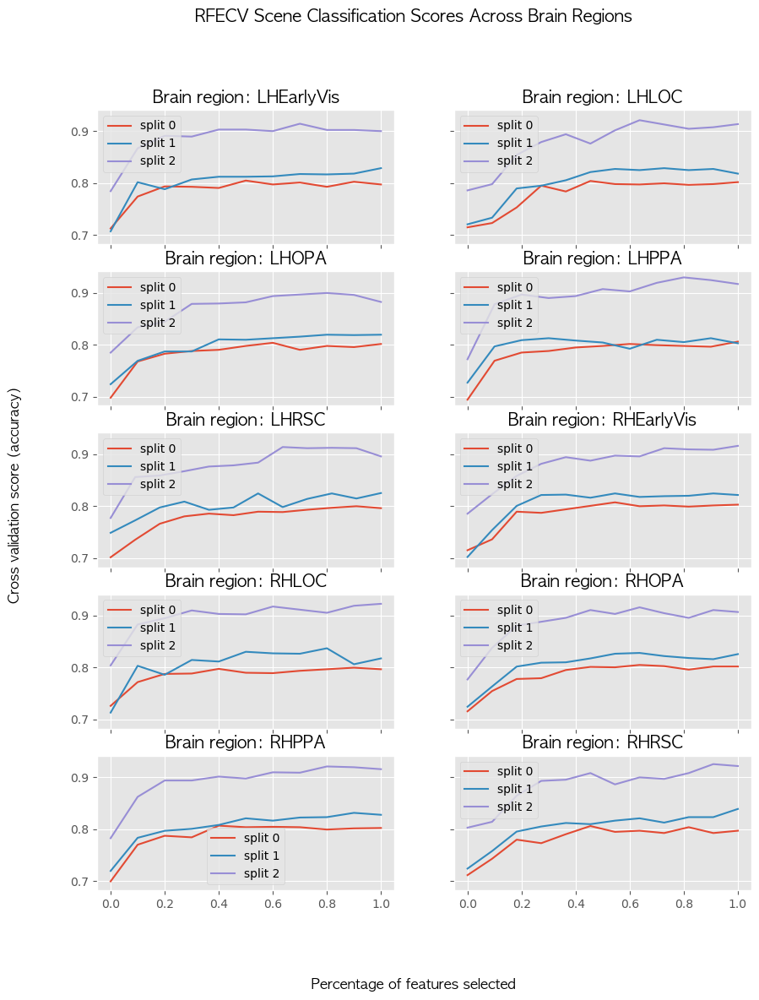

In [304]:
plt.style.use('ggplot')
fig, axs = plt.subplots(5, 2, sharex=True, sharey=True, squeeze=False, figsize=(10, 12))
fig.suptitle("RFECV Scene Classification Scores Across Brain Regions", fontname='applegothic', size='x-large')
ax_indexes = list(product(range(0,5), range(0,2)))
i = 0
for region, rfecv in rfecv_scene_models.items():
    a, b = ax_indexes[i]
    plot_rfecv(axs[a, b], rfecv.grid_scores_, region)
    i += 1
fig.supxlabel("Percentage of features selected", fontname='applegothic')
fig.supylabel("Cross validation score (accuracy)", fontname='applegothic')
fig.subplots_adjust(hspace=0.2)

The hyper-parameter grid is defined with a dictionary, then we can use grid search to find the best parameters.

Training for brain region: LHPPA for MLP classification
Original sample sizes: Counter({0: 3767, 1: 961})
Oversampled: Counter({0: 3767, 1: 2000})
Combined Random Sampling: Counter({0: 2000, 1: 2000})
Training results for MLP classifier:
Accuracy score:
0.6197718631178707
              precision    recall  f1-score   support

           0       0.80      0.70      0.74       419
           1       0.21      0.32      0.25       107

    accuracy                           0.62       526
   macro avg       0.51      0.51      0.50       526
weighted avg       0.68      0.62      0.64       526



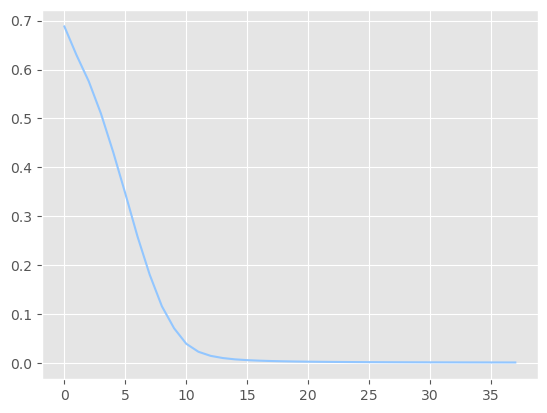

In [205]:
param_grid = {
    'hidden_layer_sizes': [(150,100,50), (120,80,40), (100,50,30)],
    'max_iter': [50, 100, 150],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}
grid = GridSearchCV(mlp_clf, param_grid, n_jobs= -1, cv=5)
grid.fit(X_train, y_train)

print(grid.best_params_)


In [208]:
grid_pred = grid.predict(X_test)
print(f'Best accuracy: {accuracy_score(y_test, grid_pred)}')

Best accuracy: 0.6615969581749049


After the grid search, we redefine our MLP classifier function that uses the best parameters for training our MLP classifier.

Lastly, we perform permutation tests on our scene classifiers to examine the statistical significance of our classification scores.
(This is very computationally expensive so we only compute the scores for the MLP model for one region)

In [ ]:
from sklearn.model_selection import permutation_test_score

score, perm_scores, pvalue = permutation_test_score(mlp_scene['LHPPA'], X_train, y_train, scoring='accuracy', cv = StratifiedKFold(2, shuffle=True, random_state=0), n_permutations=1000)


As shown in the output plot from the permutation test, we have a low p-value (0.001) which means that there is some true connection between the data and our class label.

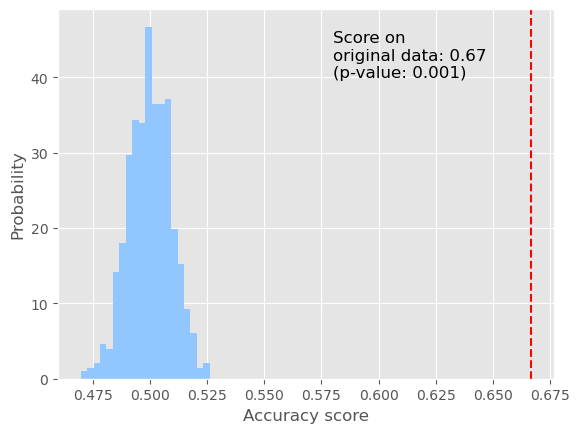

In [295]:
fig, ax = plt.subplots()
ax.hist(perm_scores, bins=20, density=True)
ax.axvline(score, ls="--", color="r")
score_label = f"Score on \noriginal data: {score:.2f} \n(p-value: {pvalue:.3f})"
ax.set_xlabel("Accuracy score")
_ = ax.set_ylabel("Probability")
ax.text(0.58, 40.0, score_label, fontsize=12)
plt.savefig('permutation_test.png')
plt.show()

## Visuals

1. Visualizing high-dimensional data : t-SNE

In [329]:
# scale and move the coordinates so they fit [0; 1] range
def scale_to_01_range(x):
    value_range = (np.max(x) - np.min(x))
    starts_from_zero = x - np.min(x)
    return starts_from_zero / value_range

def do_pca(X):
    pca = decomposition.PCA(n_components=50)
    X = pca.fit_transform(X)
    return X

def tsne_visualize_LHPPA(perplexity):
    tsne = TSNE(n_components=2, perplexity=perplexity, learning_rate=100, n_iter=2000)
    X_pca = do_pca(regions_data['LHPPA'])
    X_tsne = tsne.fit_transform(X_pca)

    # extract x and y coordinates representing the positions of the images on T-SNE plot
    tx = X_tsne[:, 0]
    ty = X_tsne[:, 1]
    
    tx = scale_to_01_range(tx)
    ty = scale_to_01_range(ty)

    data_df = pd.DataFrame()
    data_df[0] = tx
    data_df[1] = ty
    data_df['img_type'] = img_types
    data_df['scene'] = scene_labels

    pio.renderers.default = 'notebook'
    fig = px.scatter(data_df, x=0, y=1, color='scene', title=f't-SNE with Perplexity = {perplexity}')
    fig.show()

for perplexity in [20, 30, 40, 50]:
    tsne_visualize_LHPPA(perplexity)

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



/Applications/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



/Applications/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



/Applications/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.



In [307]:
fig = px.bar(sentiment_scores_df, x='region', y=['rfc_accuracy', 'svm_accuracy', 'mlp_accuracy'], barmode='group', range_y = [0.6, 0.9],
color_discrete_map={"rfc_accuracy": "RebeccaPurple", "svm_accuracy": "MediumPurple", "mlp_accuracy": "lavenderblush"}, title="Sentiment Classification Accuracy Scores for RFC, SVM, and MLP Classifiers Across Different Brain Regions")
fig.show()

In [308]:
fig = px.bar(scene_scores_df, x='region', y=['rfc_accuracy', 'svm_accuracy', 'mlp_accuracy'], barmode='group', range_y = [0.5, 0.9], title="Classification Accuracy Scores for RFC, SVM, and MLP Classifiers Across Different Brain Regions")
fig.show()

## Refection

1. What issues did you encounter when acquiring and cleaning the data?
   
   *The BOLD5000 is a very large dataset containing a variety of different data types and formats, including large fMRI raw files as well as some highly technical data that took time to navigate around. To better understand the dataset, the author needed to thoroughly read the published paper and clarifications on the project page to figure out the correct data to extract. Some challenges include: downloading and filtering through large amount of data; writing data processing code to label the dataset correctly.*

2. What features did you use in your final model and why were others excluded?
   
   *Two different types of feature selection techniques were used: RFECV (Recursive feature elimination with cross validation) and t-SNE. RFECV was able to reduce the number of features for some brain regions by doing k-fold cross validation; t-SNE in our case was not super effective for visualizing our high-dimensional data as shown in the visualization portion.*
   
3. Which ML methods did you use and why? Which performed best before you started tuning? Did things change after tuning?
   
   *As this is an exploratory project on the relationship between fMRI readings in visual processing regions of the brain and subject input stimuli, I used three different classification methods: random forest classifier, support vector machine, and multi-layer perceptron classifier. Recursive feature elimination with cross validation was used for the RFC classifier and the accuracy results were just slightly better and unfortunately not a lot of features could be eliminated. For the MLP classifier, a grid search is performed to find the best set of hyper-parameters for the neural net and it resulted in a 0.06 increase in accuracy.*

4. What was your accuracy before and then after cross validation?
   
      *Before cross validation, the accuracy was 0.6-0.8 for different brain regions. The best accuracy achieved after RFECV is about 80% across brain regions.*

5. What was the most challenging part of this project?
   
   *fMRI is a challenging topic and data type to perform machine learning on because of the high level of technicality as well as high dimensional data. There were many possible options to explore for classification and feature extraction, so with limited time it is difficult to find the best one.
   Also, with limited experience in data visualization in Python, it takes a fair amount of research to learn different ways to chart plots and set parameters using plotting packages.*

## References

1. https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60
2. https://www.kaggle.com/code/minc33/visualizing-high-dimensional-clusters/notebook
3. https://github.com/christianversloot/machine-learning-articles/blob/main/how-to-normalize-or-standardize-a-dataset-in-python.md
4. https://towardsdatascience.com/feature-extraction-techniques-d619b56e31be
5. https://medium.com/data-folks-indonesia/the-underlying-idea-of-t-sne-6ce4cff4f7
6. https://github.com/christianversloot/machine-learning-articles/blob/main/how-to-normalize-or-standardize-a-dataset-in-python.md
7. https://machinelearningmastery.com/feature-selection-with-real-and-categorical-data/
8. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5635046/
9. https://machinelearningmastery.com/rfe-feature-selection-in-python/
10. https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC
11. https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFECV.html#sklearn.feature_selection.RFECV
12. https://scikit-learn.org/stable/modules/svm.html
13. https://plotly.com/python/3d-scatter-plots/
14. https://matplotlib.org/stable/tutorials/introductory/quick_start.html#sphx-glr-tutorials-introductory-quick-start-py
15. https://michael-fuchs-python.netlify.app/2021/02/03/nn-multi-layer-perceptron-classifier-mlpclassifier/#mlpclassifier
